<center>

</center>
<div style="padding:20px;color:#150d0a;margin:10px;font-size:220%;text-align:center;display:fill;border-radius:20px;border-width: 5px;border-style: solid;border-color: #150d0a;background-color:#eca912;overflow:hidden;font-weight:500">DR Detection utilizing Deep Learning Models and XAI methods</div>

# MobileNetV3 + GNN Implementation

In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from torch_geometric.nn import GCNConv, global_mean_pool
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def generate_grid_edges(height, width):
    edges = []
    for i in range(height):
        for j in range(width):
            node = i * width + j
            if i > 0:
                edges.append([node, (i-1)*width + j])
            if i < height - 1:
                edges.append([node, (i+1)*width + j])
            if j > 0:
                edges.append([node, i*width + j - 1])
            if j < width - 1:
                edges.append([node, i*width + j + 1])
    edges = torch.tensor(edges, dtype=torch.long).t().contiguous()
    return edges

class GNNClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GNNClassifier, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, hidden_dim)
        self.classifier = nn.Linear(hidden_dim, output_dim)
    
    def forward(self, x, edge_index, batch):
        x = F.relu(self.conv1(x, edge_index))
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.conv2(x, edge_index)
        x = global_mean_pool(x, batch)
        x = self.classifier(x)
        return F.log_softmax(x, dim=1)

class MobileNetGNN(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetGNN, self).__init__()
        self.mobilenet = models.mobilenet_v3_large(pretrained=True)
        self.feature_extractor = self.mobilenet.features
        self.gnn_input_dim = 960
        self.gnn_hidden_dim = 512
        self.gnn_output_dim = num_classes
        self.gnn = GNNClassifier(self.gnn_input_dim, self.gnn_hidden_dim, self.gnn_output_dim)
    
    def forward(self, x):
        features = self.feature_extractor(x)
        B, C, H, W = features.size()
        features = features.view(B, C, H*W).permute(0, 2, 1).reshape(B*H*W, C)
        
        single_edges = generate_grid_edges(H, W).to(x.device)
        batched_edges = torch.cat([single_edges + b*H*W for b in range(B)], dim=1)
        
        batch = torch.arange(B, device=x.device).repeat_interleave(H*W)
        
        output = self.gnn(features, batched_edges, batch)
        return output

transform = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])

train_dataset = ImageFolder(root='Data_large/train', transform=transform)
val_dataset = ImageFolder(root='Data_large/val', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)

num_classes = len(train_dataset.classes)

model = MobileNetGNN(num_classes).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.NLLLoss().to(device)
best_model_path = 'best_model_V3.pth'
best_val_loss = float('inf')

def accumulate_predictions_and_labels(loader):
    model.eval()
    all_preds = []
    all_labels = []
    total_loss = 0.0
    
    with torch.no_grad():
        for data, targets in loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            total_loss += loss.item() * data.size(0)
            
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(targets.cpu().numpy())
    
    avg_loss = total_loss / len(loader.dataset)
    avg_accuracy = accuracy_score(all_labels, all_preds)
    return np.array(all_labels), np.array(all_preds), avg_loss, avg_accuracy

def compute_accuracy(loader):
    model.eval()
    correct = 0
    total = 0
    
    with torch.no_grad():
        for data, targets in loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            _, preds = torch.max(outputs, 1)
            correct += (preds == targets).sum().item()
            total += targets.size(0)
    
    return correct / total

for epoch in range(20):
    model.train()
    running_loss = 0.0
    for data, targets in train_loader:
        optimizer.zero_grad()
        data, targets = data.to(device), targets.to(device)
        outputs = model(data)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * data.size(0)
    
    train_loss = running_loss / len(train_loader.dataset)
    train_acc = compute_accuracy(train_loader)
   
    y_true, y_pred, val_loss, val_acc = accumulate_predictions_and_labels(val_loader)
    
    print(f"Epoch {epoch+1}")
    print(f"Training Loss: {train_loss:.4f}, Training Accuracy: {train_acc:.4f}")
    print(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch+1}")

cm = confusion_matrix(y_true, y_pred)
cr = classification_report(y_true, y_pred, target_names=val_dataset.classes)

print("Final Validation Metrics:")
print(f"Validation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(cr)

print("Training complete.")

Epoch 1
Training Loss: 1.1816, Training Accuracy: 0.4575
Validation Loss: 1.3249, Validation Accuracy: 0.4378
Best model saved at epoch 1
Epoch 2
Training Loss: 0.6524, Training Accuracy: 0.5484
Validation Loss: 1.1380, Validation Accuracy: 0.5806
Best model saved at epoch 2
Epoch 3
Training Loss: 0.3162, Training Accuracy: 0.3498
Validation Loss: 9.4074, Validation Accuracy: 0.2995
Epoch 4
Training Loss: 0.2732, Training Accuracy: 0.4101
Validation Loss: 4.0139, Validation Accuracy: 0.4240
Epoch 5
Training Loss: 0.1098, Training Accuracy: 0.5306
Validation Loss: 3.8037, Validation Accuracy: 0.5300
Epoch 6
Training Loss: 0.1110, Training Accuracy: 0.4644
Validation Loss: 5.2669, Validation Accuracy: 0.4562
Epoch 7
Training Loss: 0.1977, Training Accuracy: 0.4625
Validation Loss: 3.7127, Validation Accuracy: 0.4747
Epoch 8
Training Loss: 0.0775, Training Accuracy: 0.6107
Validation Loss: 2.1232, Validation Accuracy: 0.6129
Epoch 9
Training Loss: 0.1257, Training Accuracy: 0.6759
Validat

# Performance Metrics and Evaluation


Detailed Validation Metrics (Best Model):
Validation Loss: 0.2836
Accuracy: 0.9355
Precision: 0.9410
Recall: 0.9355
F1-Score: 0.9349
Specificity: 0.9840
AUC-ROC: 0.9931

Confusion Matrix:
[[74  0  2  0  2]
 [10 68  2  4  2]
 [ 0  0 96  0  0]
 [ 4  0  0 86  0]
 [ 2  0  0  0 82]]

Classification Report:
                precision    recall  f1-score   support

          Mild       0.82      0.95      0.88        78
      Moderate       1.00      0.79      0.88        86
         No_DR       0.96      1.00      0.98        96
Proliferate_DR       0.96      0.96      0.96        90
        Severe       0.95      0.98      0.96        84

      accuracy                           0.94       434
     macro avg       0.94      0.93      0.93       434
  weighted avg       0.94      0.94      0.93       434



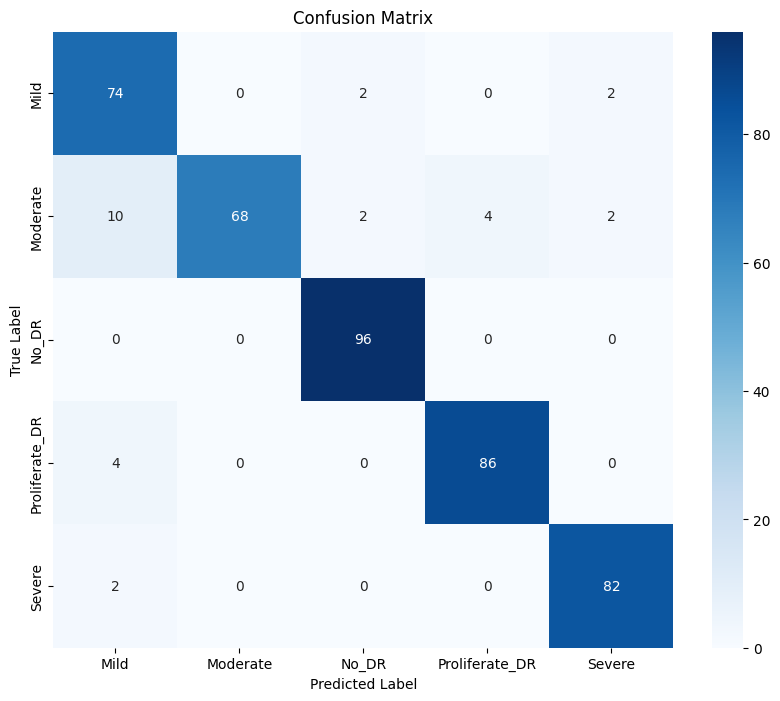

In [13]:
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
import numpy as np
import torch
import matplotlib.pyplot as plt
import seaborn as sns

def accumulate_predictions_and_labels_with_probs(loader):
    model.eval()
    all_preds = []
    all_probs = []
    all_labels = []
    total_loss = 0.0
    
    with torch.no_grad():
        for data, targets in loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            total_loss += loss.item() * data.size(0)
            probs = torch.exp(outputs)
            _, preds = torch.max(outputs, 1)
            
            all_preds.extend(preds.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(targets.cpu().numpy())
    
    avg_loss = total_loss / len(loader.dataset)
    avg_accuracy = accuracy_score(all_labels, all_preds)
    return np.array(all_labels), np.array(all_preds), np.array(all_probs), avg_loss, avg_accuracy

def calculate_all_metrics(y_true, y_pred, y_pred_proba, class_names):
    # Basic metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    cm = confusion_matrix(y_true, y_pred)
    tn = cm.sum() - (cm.sum(axis=0) + cm.sum(axis=1) - np.diag(cm))
    fp = cm.sum(axis=0) - np.diag(cm)
    specificity = np.mean(tn / (tn + fp + 1e-10))  
    y_true_one_hot = np.eye(len(np.unique(y_true)))[y_true]
    auc_roc = roc_auc_score(y_true_one_hot, y_pred_proba, multi_class='ovr')
    metrics = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'Specificity': specificity,
        'AUC-ROC': auc_roc
    }
    
    return metrics, cm

model.load_state_dict(torch.load(best_model_path, map_location=device, weights_only=False))
model.eval()
model.to(device)

y_true, y_pred, y_pred_proba, val_loss, val_acc = accumulate_predictions_and_labels_with_probs(val_loader)
metrics, cm = calculate_all_metrics(y_true, y_pred, y_pred_proba, val_dataset.classes)

print("\nDetailed Validation Metrics (Best Model):")
print(f"Validation Loss: {val_loss:.4f}")
for metric_name, value in metrics.items():
    print(f"{metric_name}: {value:.4f}")

print("\nConfusion Matrix:")
print(cm)

print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=val_dataset.classes))

def plot_confusion_matrix(cm, class_names):
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names,
                yticklabels=class_names)
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

plot_confusion_matrix(cm, val_dataset.classes)

# MobileNetV3 + RNN Implementation

In [45]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# RNN Classifier
class RNNClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, num_layers=1):
        super(RNNClassifier, self).__init__()
        self.rnn = nn.RNN(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
    
    def forward(self, x):
        rnn_out, _ = self.rnn(x)  
        out = self.fc(rnn_out[:, -1, :])  
        return F.log_softmax(out, dim=1)


class MobileNetRNN(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetRNN, self).__init__()
        self.mobilenet = models.mobilenet_v3_large(pretrained=True)
        self.feature_extractor = self.mobilenet.features  
        
        self.rnn_input_dim = 960  
        self.rnn_hidden_dim = 512
        self.rnn_output_dim = num_classes
        
        self.rnn = RNNClassifier(self.rnn_input_dim, self.rnn_hidden_dim, self.rnn_output_dim)
    
    def forward(self, x):
        features = self.feature_extractor(x)  
        features = features.view(features.size(0), features.size(1), -1).permute(0, 2, 1)  
        output = self.rnn(features)
        return output


transform = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])


train_dataset = ImageFolder(root='Data_large/train', transform=transform)
val_dataset = ImageFolder(root='Data_large/val', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)

num_classes = len(train_dataset.classes)

model = MobileNetRNN(num_classes).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.NLLLoss()
best_model_path = 'best_model_rnn_V3.pth'
best_val_loss = float('inf')

def accumulate_predictions_and_labels(loader):
    model.eval()
    all_preds = []
    all_labels = []
    total_loss = 0.0
    
    with torch.no_grad():
        for data, targets in loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            total_loss += loss.item() * data.size(0)
            
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(targets.cpu().numpy())
    
    avg_loss = total_loss / len(loader.dataset)
    avg_accuracy = accuracy_score(all_labels, all_preds)
    return np.array(all_labels), np.array(all_preds), avg_loss, avg_accuracy

def compute_accuracy(loader):
    model.eval()
    correct = 0
    total = 0
    
    with torch.no_grad():
        for data, targets in loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            _, preds = torch.max(outputs, 1)
            correct += (preds == targets).sum().item()
            total += targets.size(0)
    
    return correct / total

for epoch in range(17):
    model.train()
    running_loss = 0.0
    for data, targets in train_loader:
        optimizer.zero_grad()
        data, targets = data.to(device), targets.to(device)
        outputs = model(data)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * data.size(0)
    
    train_loss = running_loss / len(train_loader.dataset)
    train_acc = compute_accuracy(train_loader)
    
    y_true, y_pred, val_loss, val_acc = accumulate_predictions_and_labels(val_loader)
    
    print(f"Epoch {epoch+1}")
    print(f"Training Loss: {train_loss:.4f}, Training Accuracy: {train_acc:.4f}")
    print(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch+1}")


cm = confusion_matrix(y_true, y_pred)
cr = classification_report(y_true, y_pred, target_names=val_dataset.classes)

print("Final Validation Metrics:")
print(f"Validation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(cr)

print("Training complete.")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V3_Large_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V3_Large_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1
Training Loss: 1.2331, Training Accuracy: 0.3310
Validation Loss: 1.5907, Validation Accuracy: 0.3180
Best model saved at epoch 1
Epoch 2
Training Loss: 0.5442, Training Accuracy: 0.3735
Validation Loss: 2.0446, Validation Accuracy: 0.3779
Epoch 3
Training Loss: 0.1941, Training Accuracy: 0.4348
Validation Loss: 2.4814, Validation Accuracy: 0.4332
Epoch 4
Training Loss: 0.1292, Training Accuracy: 0.4397
Validation Loss: 2.3936, Validation Accuracy: 0.4194
Epoch 5
Training Loss: 0.1042, Training Accuracy: 0.3172
Validation Loss: 3.9165, Validation Accuracy: 0.3134
Epoch 6
Training Loss: 0.1218, Training Accuracy: 0.4901
Validation Loss: 2.2517, Validation Accuracy: 0.4931
Epoch 7
Training Loss: 0.1202, Training Accuracy: 0.6057
Validation Loss: 1.5397, Validation Accuracy: 0.6037
Best model saved at epoch 7
Epoch 8
Training Loss: 0.0666, Training Accuracy: 0.7441
Validation Loss: 0.8065, Validation Accuracy: 0.7558
Best model saved at epoch 8
Epoch 9
Training Loss: 0.0321, Train

# Performance Metrics and Evaluation


Detailed Validation Metrics (Best Model):
Validation Loss: 0.1133
Accuracy: 0.9724
Precision: 0.9754
Recall: 0.9724
F1-Score: 0.9729
Specificity: 0.9929
AUC-ROC: 0.9956

Confusion Matrix:
[[74  0  4  0  0]
 [ 0 82  4  0  0]
 [ 0  0 96  0  0]
 [ 0  0  2 88  0]
 [ 0  0  2  0 82]]

Classification Report:
                precision    recall  f1-score   support

          Mild       1.00      0.95      0.97        78
      Moderate       1.00      0.95      0.98        86
         No_DR       0.89      1.00      0.94        96
Proliferate_DR       1.00      0.98      0.99        90
        Severe       1.00      0.98      0.99        84

      accuracy                           0.97       434
     macro avg       0.98      0.97      0.97       434
  weighted avg       0.98      0.97      0.97       434



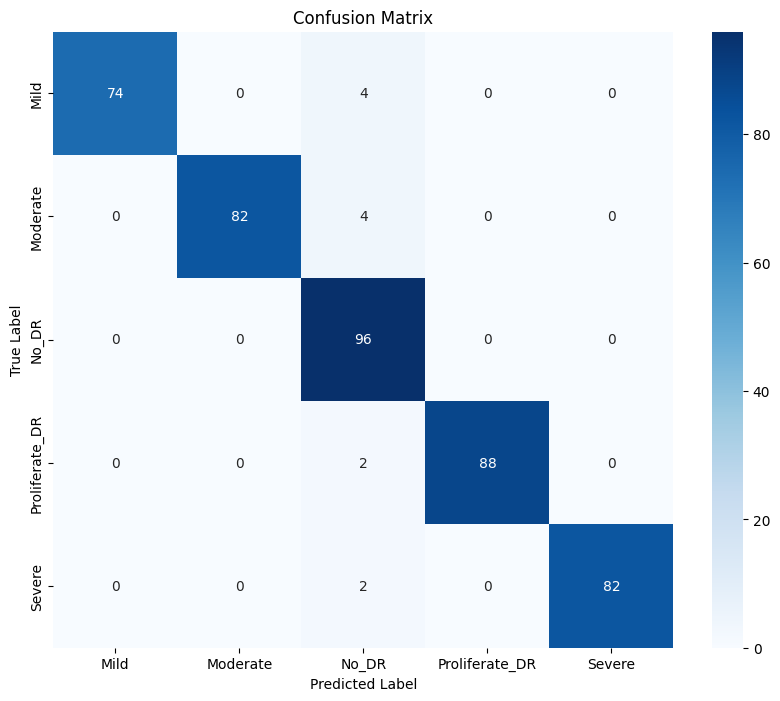

In [46]:
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
import numpy as np
import torch
import matplotlib.pyplot as plt
import seaborn as sns

def accumulate_predictions_and_labels_with_probs(loader):
    model.eval()
    all_preds = []
    all_probs = []
    all_labels = []
    total_loss = 0.0
    
    with torch.no_grad():
        for data, targets in loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            total_loss += loss.item() * data.size(0)
            probs = torch.exp(outputs)
            _, preds = torch.max(outputs, 1)
            
            all_preds.extend(preds.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(targets.cpu().numpy())
    
    avg_loss = total_loss / len(loader.dataset)
    avg_accuracy = accuracy_score(all_labels, all_preds)
    return np.array(all_labels), np.array(all_preds), np.array(all_probs), avg_loss, avg_accuracy

def calculate_all_metrics(y_true, y_pred, y_pred_proba, class_names):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    cm = confusion_matrix(y_true, y_pred)
    tn = cm.sum() - (cm.sum(axis=0) + cm.sum(axis=1) - np.diag(cm))
    fp = cm.sum(axis=0) - np.diag(cm)
    specificity = np.mean(tn / (tn + fp + 1e-10))  
    y_true_one_hot = np.eye(len(np.unique(y_true)))[y_true]
    auc_roc = roc_auc_score(y_true_one_hot, y_pred_proba, multi_class='ovr')

    metrics = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'Specificity': specificity,
        'AUC-ROC': auc_roc
    }
    
    return metrics, cm


model.load_state_dict(torch.load(best_model_path, map_location=device, weights_only=False))
model.eval()
model.to(device)

y_true, y_pred, y_pred_proba, val_loss, val_acc = accumulate_predictions_and_labels_with_probs(val_loader)
metrics, cm = calculate_all_metrics(y_true, y_pred, y_pred_proba, val_dataset.classes)

print("\nDetailed Validation Metrics (Best Model):")
print(f"Validation Loss: {val_loss:.4f}")
for metric_name, value in metrics.items():
    print(f"{metric_name}: {value:.4f}")

print("\nConfusion Matrix:")
print(cm)

print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=val_dataset.classes))

def plot_confusion_matrix(cm, class_names):
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names,
                yticklabels=class_names)
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

plot_confusion_matrix(cm, val_dataset.classes)

# Grad-CAM Visualizations of MobileNetV3 + RNN Hybrid Model

<ipython-input-18-4162dd27fbe4>:129: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(saved_model_path, map_location=device))
/usr/local/lib/py

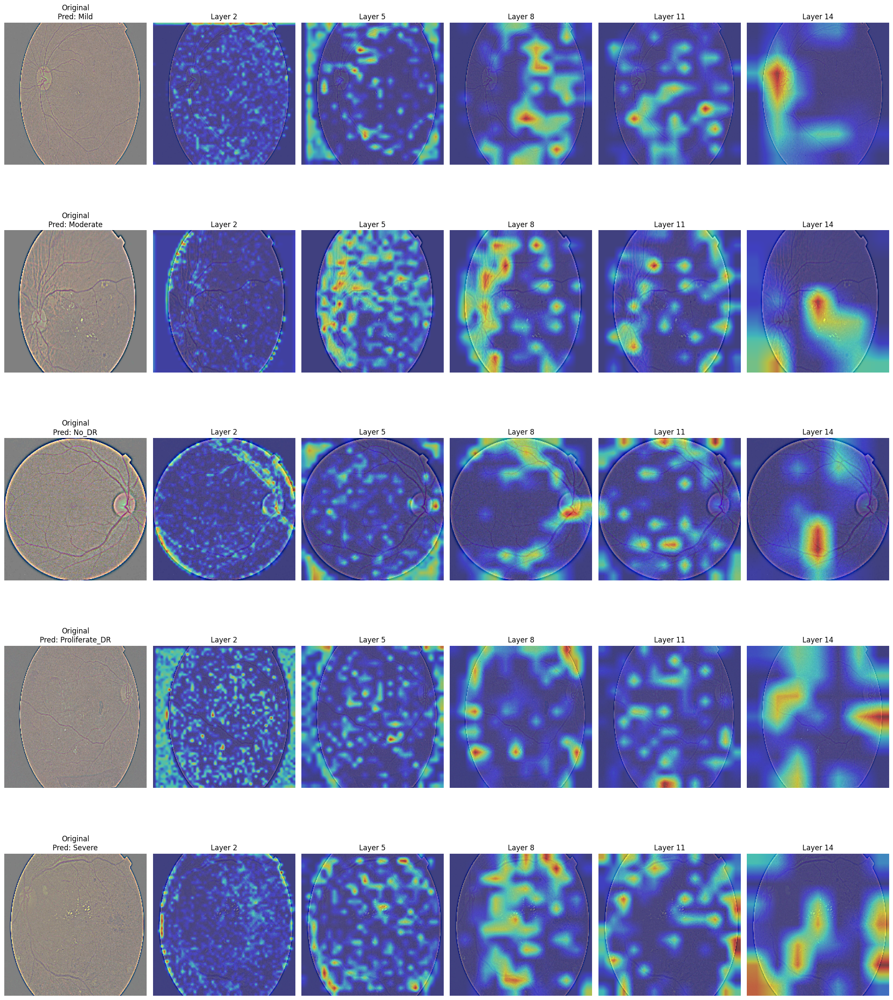

In [18]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class RNNClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, num_layers=1):
        super(RNNClassifier, self).__init__()
        self.rnn = nn.RNN(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
    
    def forward(self, x):
        rnn_out, _ = self.rnn(x)
        out = self.fc(rnn_out[:, -1, :])
        return F.log_softmax(out, dim=1)


class MobileNetRNN(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetRNN, self).__init__()
        self.mobilenet = models.mobilenet_v3_large(pretrained=True)
        self.feature_extractor = self.mobilenet.features
        

        self.rnn_input_dim = 960 
        self.rnn_hidden_dim = 512
        self.rnn_output_dim = num_classes
        
        self.rnn = RNNClassifier(self.rnn_input_dim, self.rnn_hidden_dim, self.rnn_output_dim)
    
    def forward(self, x):
        features = self.feature_extractor(x)
        features = features.view(features.size(0), features.size(1), -1).permute(0, 2, 1)
        output = self.rnn(features)
        return output

class GradCAM:
    def __init__(self, model, target_layers):
        self.model = model
        self.target_layers = target_layers
        self.gradients = []
        self.activations = []
        self.hooks = []
        self.register_hooks()

    def register_hooks(self):
        for layer in self.target_layers:
            self.hooks.append(layer.register_forward_hook(self.forward_hook))
            self.hooks.append(layer.register_backward_hook(self.backward_hook))

    def forward_hook(self, module, input, output):
        self.activations.append(output)

    def backward_hook(self, module, grad_input, grad_output):
        self.gradients.append(grad_output[0])

    def generate_heatmap(self, image, class_idx):
        self.activations = []
        self.gradients = []

        image = image.to(device)
        self.model.train() 
        output = self.model(image)
        self.model.zero_grad()
        one_hot_output = torch.zeros_like(output)
        one_hot_output[0, class_idx] = 1
        output.backward(gradient=one_hot_output)
        self.model.eval()
        
        heatmaps = []
        for activation, gradient in zip(self.activations, self.gradients):
            B, C_act, H, W = activation.shape
            weights = torch.mean(gradient, dim=[2, 3], keepdim=True)
            C_final = min(activation.shape[1], gradient.shape[1])
            cam = F.relu(torch.sum(weights[:, :C_final] * activation[:, :C_final], dim=1))
            cam = cam.cpu().detach().numpy()
            cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
            cam = cv2.resize(cam[0], (224, 224))
            heatmaps.append(cam)
        
        return heatmaps

transform = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])

val_dataset = ImageFolder(root='Data_large/val', transform=transform)
class_names = val_dataset.classes
num_classes = len(class_names)

model = MobileNetRNN(num_classes)

saved_model_path = '/kaggle/input/rnn_v3_model/pytorch/default/1/best_model_rnn_V3.pth'
model.load_state_dict(torch.load(saved_model_path, map_location=device))
model.to(device)
model.eval()


layer_indices = [2, 5, 8, 11, 14]
target_layers = [model.mobilenet.features[i] for i in layer_indices]
cam = GradCAM(model, target_layers)

def preprocess_image(image_path):
    transform_pipeline = transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
    ])
    image = Image.open(image_path).convert('RGB')
    image = transform_pipeline(image).unsqueeze(0)
    return image

image_paths = [
    'Data_large/val/Mild/3c726de3ee90.png',
    'Data_large/val/Moderate/8aab201c0691.png',
    'Data_large/val/No_DR/c24bcf7a1bc4.png',
    'Data_large/val/Proliferate_DR/08a3875063c3.png',
    'Data_large/val/Severe/070f67572d03.png',
]

num_images = len(image_paths)
num_heatmaps = len(layer_indices)
num_subplots_per_image = 1 + num_heatmaps

fig, axes = plt.subplots(num_images, num_subplots_per_image, figsize=(3.5 * num_subplots_per_image, 5 * num_images))

if num_images == 1:
    axes = np.expand_dims(axes, axis=0)

for i, image_path in enumerate(image_paths):
    image = preprocess_image(image_path).to(device)

    with torch.no_grad():
        output = model(image)
        _, predicted_class = torch.max(output, 1)
        class_idx = predicted_class.item()

    heatmaps = cam.generate_heatmap(image, class_idx)

    orig_img = Image.open(image_path)
    axes[i, 0].imshow(orig_img)
    axes[i, 0].set_title(f'Original\nPred: {class_names[class_idx]}')
    axes[i, 0].axis('off')

    for j, heatmap in enumerate(heatmaps):
        axes[i, j+1].imshow(orig_img)
        axes[i, j+1].imshow(heatmap, cmap='jet', alpha=0.5)
        axes[i, j+1].set_title(f'Layer {layer_indices[j]}')
        axes[i, j+1].axis('off')

plt.tight_layout()
plt.show()


# Heatmaps of Multiple Classes of DR stages from MobileNetV3+RNN model

<ipython-input-32-faad8c076e46>:32: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load('/kaggle/input/rnn_v3_model/pytorch/default/1/best_model_rnn_V3.pth

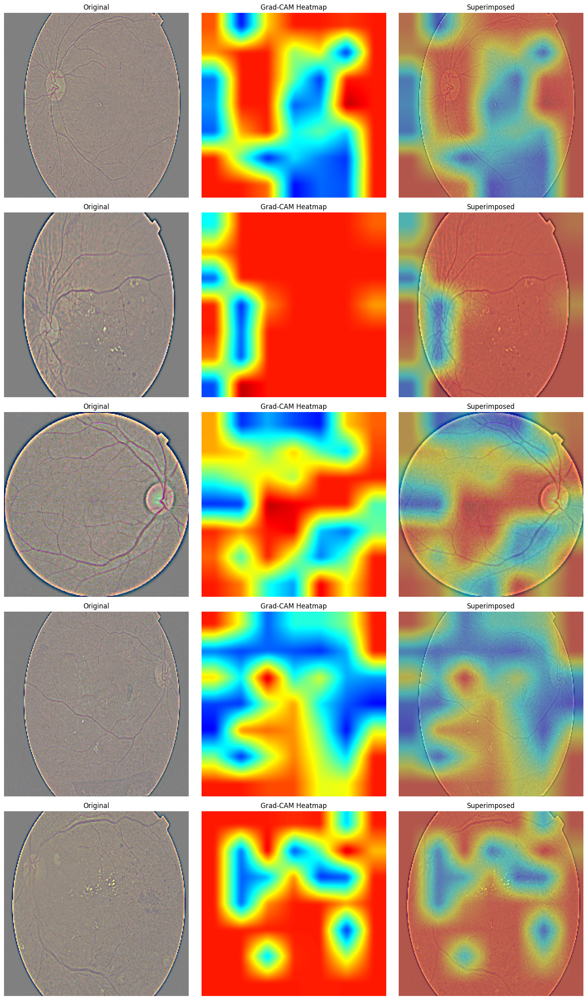

In [32]:
import os
import torch
import torch.nn.functional as F
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torchvision.models import mobilenet_v3_large

num_classes = len(ImageFolder(root='Data_large/val').classes)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class MobileNetRNN(torch.nn.Module):
    def __init__(self, num_classes):
        super(MobileNetRNN, self).__init__()
        self.mobilenet = mobilenet_v3_large(weights="IMAGENET1K_V1")
        self.feature_extractor = self.mobilenet.features
        self.rnn = torch.nn.RNN(960, 512, batch_first=True)
        self.fc = torch.nn.Linear(512, num_classes)
    
    def forward(self, x):
        features = self.feature_extractor(x)
        features = features.view(features.size(0), features.size(1), -1).permute(0, 2, 1)
        rnn_out, _ = self.rnn(features)
        out = self.fc(rnn_out[:, -1, :])
        return F.log_softmax(out, dim=1)

model = MobileNetRNN(num_classes).to(device)
state_dict = torch.load('/kaggle/input/rnn_v3_model/pytorch/default/1/best_model_rnn_V3.pth', map_location=device)

new_state_dict = {}
for key, value in state_dict.items():
    new_key = key.replace("rnn.rnn", "rnn")  
    new_state_dict[new_key] = value

model.load_state_dict(new_state_dict, strict=False)
model.eval()

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None
        target_layer.register_forward_hook(self.forward_hook)
        target_layer.register_backward_hook(self.backward_hook)
    
    def forward_hook(self, module, input, output):
        self.activations = output
    
    def backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]
    
    def generate_heatmap(self, image, class_idx):
        self.model.train() 
        
        output = self.model(image)
        one_hot_output = torch.zeros_like(output).to(device)
        one_hot_output[0, class_idx] = 1
    
        output.backward(gradient=one_hot_output) 
    
        self.model.eval()  
 
        weights = torch.mean(self.gradients, dim=(2, 3), keepdim=True)
        cam = torch.sum(weights * self.activations, dim=1)
        cam = torch.relu(cam) 
    
        return cam.detach().cpu().numpy()


target_layer = model.mobilenet.features[-1]
cam = GradCAM(model, target_layer)

def preprocess_image(image_path):
    transform = transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
    ])
    image = Image.open(image_path).convert('RGB')
    return transform(image).unsqueeze(0)

# Test images
image_paths = [
    'Data_large/val/Mild/3c726de3ee90.png',
    'Data_large/val/Moderate/8aab201c0691.png',
    'Data_large/val/No_DR/c24bcf7a1bc4.png',
    'Data_large/val/Proliferate_DR/08a3875063c3.png',
    'Data_large/val/Severe/070f67572d03.png',
]

fig, axes = plt.subplots(len(image_paths), 3, figsize=(15, 5 * len(image_paths)))

for i, image_path in enumerate(image_paths):
    image = preprocess_image(image_path).to(device)
    output = model(image)
    class_idx = output.argmax().item()
    heatmap = cam.generate_heatmap(image, class_idx)
    heatmap = np.uint8(255 * (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min()))  
    heatmap = np.squeeze(heatmap)  

    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    
    original_image = Image.open(image_path)
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())  
    heatmap = cv2.resize(heatmap, (224, 224), interpolation=cv2.INTER_LINEAR)  
    heatmap = cv2.GaussianBlur(heatmap, (11, 11), 0)  
    heatmap = np.uint8(255 * heatmap)  

    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    overlay = np.array(original_image) * 0.6 + heatmap * 0.4
    overlay = np.clip(overlay, 0, 255).astype(np.uint8)
    
    axes[i, 0].imshow(original_image)
    axes[i, 0].set_title("Original")
    axes[i, 0].axis("off")
    axes[i, 1].imshow(heatmap)
    axes[i, 1].set_title("Grad-CAM Heatmap")
    axes[i, 1].axis("off")
    axes[i, 2].imshow(overlay)
    axes[i, 2].set_title("Superimposed")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()
